In [ ]:
pip install bar_chart_race

In [ ]:
pip install ffmpeg-python

In [ ]:
pip install plotly --upgrade

In [1]:
import numpy as np
import pandas as pd
import bar_chart_race as bcr
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import plotly.express as px

# about data #

Life expectancy & Socio-Economic (world bank):
Life expectancy at birth indicates the number of years a newborn infant would live if prevailing
patterns of mortality at the time of its birth were to stay the same throughout its life. It is a key
metric for assessing population health.

Life expectancy has burgeoned since the advent of industrialization in the early 1900s and the world average has now more than doubled to 70 years. Yet, we still see inequality in life expectancy across and within countries. The study by Acemoglu and Johnson demonstrated the relationship between increased life expectancy
and improvement in economic growth (GDP per capita), controlling for country-fixed effects. In the
table below, we have shown how life expectancy varies between high-income and low-income countries.

**Country Name:** The names of the 174 countries included in the dataset.

**Country Code:** Three-letter country codes for unique identification

**Region:** The geographical region of the world where each country is located.

**IncomeGroup:** The income class to which each country belongs.

**Year:** The time period ranging from 2000 to 2019, inclusive.

**Life Expectancy World Bank:** The average lifespan at birth for each country-year combination, as reported by the World Bank.

**Prevelance of Undernourishment:** The percentage of the population with insufficient food consumption for a healthy life.

**CO2:** The amount of carbon dioxide emissions, stemming from fossil fuel burning and cement manufacture (measured in some unit, not specified).

**Health Expenditure %:** The proportion of a country's Gross Domestic Product (GDP) allocated to healtioe.

**Educatio    n Expenditure %:**The percentage of GDP spent on education by the government.

**Unemployment:** The percentage of the labor force that is unemployed and actively seeking employment.

**Corruption:** A measure of transparency, accountability, and corruption in the public sector.

**Sanitation:** The percentage of people with access to safely managed sanitation services.

**Injuries:** Disability-Adjusted Life Years lost due to injuries, considering both premature mortality and disabiOne DALY represents
the loss of the equivalent of one year of full health. DALYs for a communicable disease or health
condition is the sum of the years of life lost due to premature mortality (YLLs) and the years
lived with a disability (YLDs) due to prevalent cases of the disease in a populationue to communicable dOne DALY represents
the loss of the equivalent of one year of full health. DALYs for a non-communicable disease or health
condition is the sum of the years of life lost due to premature mortality (YLLs) and the years
lived with a disability (YLDs) due to prevalent cases of the disease in a populationdue to non-communicable diseases.

In [2]:
data = pd.read_csv("life expectancy.csv")

In [3]:
data.head()

,Country Name,Country Code,Region,IncomeGroup,Year,Life Expectancy World Bank,Prevelance of Undernourishment,CO2,Health Expenditure %,Education Expenditure %,Unemployment,Corruption,Sanitation,Injuries,Communicable,NonCommunicable
0,Afghanistan,AFG,South Asia,Low income,2001,56.308,47.8,730.0,NaN,NaN,10.809000,NaN,NaN,2179727.10,9689193.70,5795426.38
1,Angola,AGO,Sub-Saharan Africa,Lower middle income,2001,47.059,67.5,15960.0,4.483516,NaN,4.004000,NaN,NaN,1392080.71,11190210.53,2663516.34
2,Albania,ALB,Europe & Central Asia,Upper middle income,2001,74.288,4.9,3230.0,7.139524,3.4587,18.575001,NaN,40.520895,117081.67,140894.78,532324.75
3,Andorra,AND,Europe & Central Asia,High income,2001,NaN,NaN,520.0,5.865939,NaN,NaN,NaN,21.788660,1697.99,695.56,13636.64
4,United Arab Emirates,ARE,Middle East & North Africa,High income,2001,74.544,2.8,97200.0,2.484370,NaN,2.493000,NaN,NaN,144678.14,65271.91,481740.70


In [4]:
data.fillna(0, inplace=True)
data

,Country Name,Country Code,Region,IncomeGroup,Year,Life Expectancy World Bank,Prevelance of Undernourishment,CO2,Health Expenditure %,Education Expenditure %,Unemployment,Corruption,Sanitation,Injuries,Communicable,NonCommunicable
0,Afghanistan,AFG,South Asia,Low income,2001,56.308,47.8,730.000000,0.000000,0.00000,10.809000,0.0,0.000000,2179727.10,9689193.70,5795426.38
1,Angola,AGO,Sub-Saharan Africa,Lower middle income,2001,47.059,67.5,15960.000000,4.483516,0.00000,4.004000,0.0,0.000000,1392080.71,11190210.53,2663516.34
2,Albania,ALB,Europe & Central Asia,Upper middle income,2001,74.288,4.9,3230.000000,7.139524,3.45870,18.575001,0.0,40.520895,117081.67,140894.78,532324.75
3,Andorra,AND,Europe & Central Asia,High income,2001,0.000,0.0,520.000000,5.865939,0.00000,0.000000,0.0,21.788660,1697.99,695.56,13636.64
4,United Arab Emirates,ARE,Middle East & North Africa,High income,2001,74.544,2.8,97200.000000,2.484370,0.00000,2.493000,0.0,0.000000,144678.14,65271.91,481740.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3301,Vanuatu,VUT,East Asia & Pacific,Lower middle income,2019,70.474,12.4,209.999993,3.360347,1.77788,1.801000,3.0,0.000000,12484.18,26032.56,69213.56
3302,Samoa,WSM,East Asia & Pacific,Lower middle income,2019,73.321,4.4,300.000012,6.363094,4.70625,8.406000,4.0,47.698788,6652.84,9095.19,43798.62
3303,South Africa,ZAF,Sub-Saharan Africa,Upper middle income,2019,64.131,6.3,439640.014648,9.109355,5.91771,28.469999,0.0,0.000000,3174676.10,13198944.71,10214261.89
3304,Zambia,ZMB,Sub-Saharan Africa,Low income,2019,63.886,0.0,6800.000191,5.312203,4.46518,12.520000,2.5,0.000000,510982.75,4837094.00,2649687.82


In [5]:
# Select the year for which you want to find the top 10 countries
selected_year = 2019
# Filter the DataFrame for the selected year
data_selected_year = data[data['Year'] == selected_year]
# Extract the top 10 countries by life expectancy for the selected year
top_10_countries_selected_year = data_selected_year.nlargest(10, 'CO2', 'all')['Country Name'].tolist()

# Filter the DataFrame for the top 10 countries
top_10_data = data[data['Country Name'].isin(top_10_countries_selected_year)]
# Display the top 10 countries' data for all years
print(top_10_data[['Country Name', 'Year', 'CO2']])

       Country Name  Year           CO2
29           Canada  2001  5.066200e+05
32            China  2001  3.529080e+06
40          Germany  2001  8.476800e+05
71        Indonesia  2001  3.020600e+05
72            India  2001  9.535400e+05
...             ...   ...           ...
3212          Japan  2019  1.081570e+06
3231         Mexico  2019  4.492700e+05
3268   Saudi Arabia  2019  5.237800e+05
3298  United States  2019  4.817720e+06
3303   South Africa  2019  4.396400e+05

[190 rows x 3 columns]


In [6]:
pivot_top10 = top_10_data.pivot_table(index='Year', columns='Country Name', values='CO2')
pivot_top10

Country Name,Canada,China,Germany,India,Indonesia,Japan,Mexico,Saudi Arabia,South Africa,United States
Year,,,,,,,,,,
2001,506620.000000,3.529080e+06,847680.000000,9.535400e+05,302060.000000,1.170380e+06,378830.000000,254090.000000,320540.000000,5.748260e+06
2002,524349.975586,3.810060e+06,833380.004883,9.854500e+05,305640.014648,1.206600e+06,386000.000000,272250.000000,331320.007324,5.593030e+06
2003,544539.978027,4.415910e+06,836789.978027,1.011770e+06,333890.014648,1.214950e+06,404690.002441,284829.986572,353089.996338,5.658990e+06
2004,536419.982910,5.124820e+06,821070.007324,1.085670e+06,341239.990234,1.209850e+06,414100.006104,299890.014648,379989.990234,5.738290e+06
2005,549030.029297,5.824630e+06,802380.004883,1.136470e+06,342149.993896,1.212820e+06,432190.002441,315290.008545,377649.993896,5.753490e+06
2006,540530.029297,6.437470e+06,814409.973145,1.215210e+06,364470.001221,1.189520e+06,448299.987793,335440.002441,379790.008545,5.653080e+06
2007,571630.004883,6.993180e+06,783799.987793,1.336740e+06,379959.991455,1.225070e+06,457119.995117,354619.995117,397059.997559,5.736320e+06
2008,550469.970703,7.199600e+06,789690.002441,1.424380e+06,376140.014648,1.158220e+06,459549.987793,389720.001221,426739.990234,5.558380e+06
2009,521320.007324,7.719070e+06,734809.997559,1.564880e+06,391079.986572,1.100980e+06,448369.995117,406529.998779,404200.012207,5.156430e+06


# CO2 for Top 10 Countries #

In [7]:

# Create the bar chart race
bcr.bar_chart_race(
    df= pivot_top10,
    filename=None,
    figsize=(4, 3),
    title="CO2 for Top 10 Countries",
)

C:\Users\Hritika\anaconda3\Lib\site-packages\bar_chart_race\_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
C:\Users\Hritika\anaconda3\Lib\site-packages\bar_chart_race\_make_chart.py:286: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(self.df_values.columns)
C:\Users\Hritika\anaconda3\Lib\site-packages\bar_chart_race\_make_chart.py:287: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([max_val] * len(ax.get_xticks()))


# INSIGHTS #

In [8]:
life_expectancy_data = top_10_data.pivot_table(index='Year', columns='Country Name', values='Life Expectancy World Bank')

# Print or further analyze the CO2 data
life_expectancy_data

Country Name,Canada,China,Germany,India,Indonesia,Japan,Mexico,Saudi Arabia,South Africa,United States
Year,,,,,,,,,,
2001,79.339024,71.732,78.329268,62.907,66.037,81.417073,74.658,72.759,55.089,76.836585
2002,79.490244,72.061,78.229268,63.304,66.321,81.563415,74.922,72.920,54.310,76.936585
2003,79.741463,72.381,78.380488,63.699,66.631,81.760000,75.118,73.051,53.749,77.036585
2004,79.892683,72.689,78.680488,64.095,66.969,82.030244,75.243,73.159,53.444,77.487805
2005,80.192683,72.985,78.931707,64.500,67.334,81.925122,75.300,73.256,53.447,77.487805
2006,80.343902,73.271,79.131707,64.918,67.717,82.321951,75.296,73.355,53.795,77.687805
2007,80.543902,73.553,79.534146,65.350,68.105,82.507073,75.255,73.467,54.452,77.987805
2008,80.695122,73.835,79.736585,65.794,68.485,82.587561,75.194,73.598,55.360,78.039024
2009,80.995122,74.119,79.836585,66.244,68.853,82.931463,75.128,73.750,56.460,78.390244


# Life Expectancy of top 10 countries #

In [9]:

# Create the bar chart race
bcr.bar_chart_race(
    df=life_expectancy_data,
    filename=None,
    figsize=(4, 3),
    title="Life Expectancy of top 10 countries",
)

C:\Users\Hritika\anaconda3\Lib\site-packages\bar_chart_race\_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
C:\Users\Hritika\anaconda3\Lib\site-packages\bar_chart_race\_make_chart.py:286: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(self.df_values.columns)
C:\Users\Hritika\anaconda3\Lib\site-packages\bar_chart_race\_make_chart.py:287: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([max_val] * len(ax.get_xticks()))


## INSIGHTS ##

Life Expectancy of top 10 countries:

We selected Life Expectancy of top 10 countrie same as selected for CO2 Emissions for 10 Countries because:
The observations aim to highlight the complex relationship between CO2 emissions, environmental impact, and public health.       
CO2 emissions are a critical factor in climate change and have far-reaching implications for global health and well-being.                              
The inferences drawn from the observations highlight the diverse relationships between life expectancy and CO2 emissions across countries.                                  

**OBSERVATION:**
1. The U.S. has shown a commendable effort in reducing its CO2 emissions, reflecting a commitment to environmental sustainability. This aligns with the increasing trend in life expectancy over the years, indicating improvements in healthcare, lifestyle, and overall well-being
2. A major contributor to global CO2 emissions, China's rising emissions coincide with a reduction in average life expectancy. This observation suggests a potential adverse health impact of high pollution levels and underscores the need for sustainable practices..
3.  Countries with relatively stable or decreasing CO2 emissions, like Mexico and Saudi Arabia, maintain consistent average life spans. This correlation suggests that maintaining lower emission levels may contribute to stable public health outcomes.
4. Nations with high average life expectancies, including Japan, Canada, and Germany, showcase a positive connection between robust healthcare systems, socio-economic conditions, and longer life spans. Their relatively lower initial CO2 emissions indicate a potential focus on sustainable development.
5.  
Indonesia, India, and South Africa consistently fall among the bottom three in terms of average life span. Despite this, there is a positive trend as their average life expectancy increases with each passing year. This suggests improvements in healthcare, public health interventions, and socio-economic conditions contributing to longer and healthr lifestyleie
6. Countries having low emission leads to have high expectancy but this trends is not followed by south africa. which might be influenced by other factors as we es.

It's important to note that these observations highlight the dynamic nature of life expectancy trends, influenced by a multitude of factors ranging from healthcare systems to socio-economic development. The nuanced differences among countries underscore the need for tailored strategies in public health and social policie*nf
eThe observations of life expectancy can be linked to CO2 emissions through the complex relationship between environmental, economic, and social factors in shaping life expectancy trends. This data have shown a strong association between income and life expectancy, with higher income associated with greater loity. vT.. The impact of CO2 emissions on life expectancy may depend on factors such as income or wealth effect and heaeffelthe
 
The impact of environmental degradation, including air pollution caused by CO2 emissions, may have a negative effect on life expecy. .. For instance, the reduction in CO2 emissions in South Africa suggests possible efforts to address environmental concerns, which may have contribute  to the stability in average life expectancy over the obseryears..

 

# Line chart of income group vs Life Expectancy World Bank year wise #

In [10]:
# Group by 'Year' and 'IncomeGroup' and calculate the mean life expectancy
gd = data.groupby(['Year', 'IncomeGroup'])['Life Expectancy World Bank'].mean().reset_index()

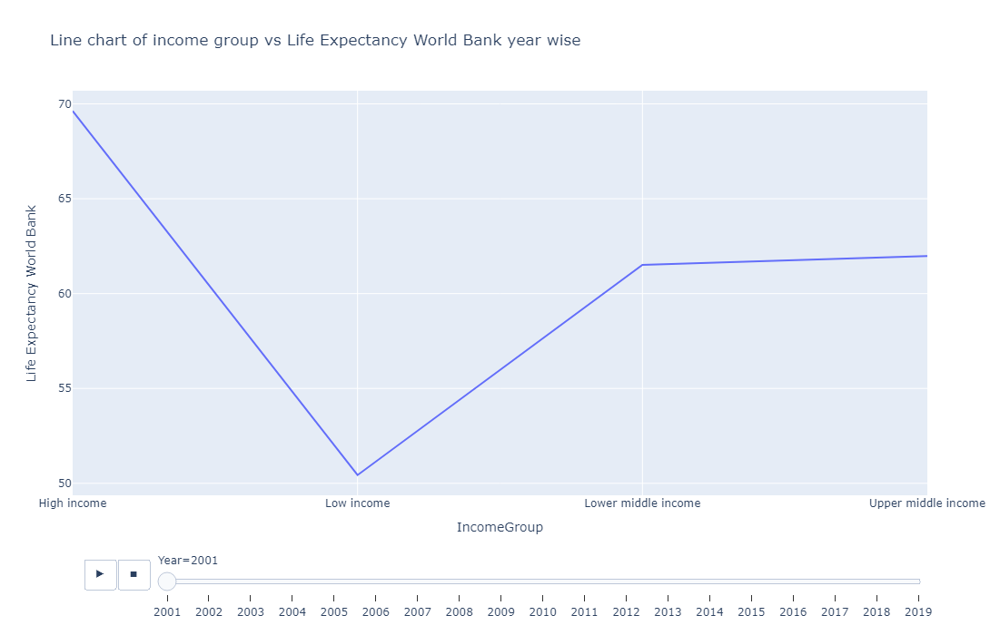

In [11]:
fig = px.line(gd, x='IncomeGroup', y='Life Expectancy World Bank',
              animation_frame='Year', title='Line chart of income group vs Life Expectancy World Bank year wise',
              height=700)

fig.show()

## INSIGHTS ##

# Top 10 Unemployment Countries (Year-wise) #

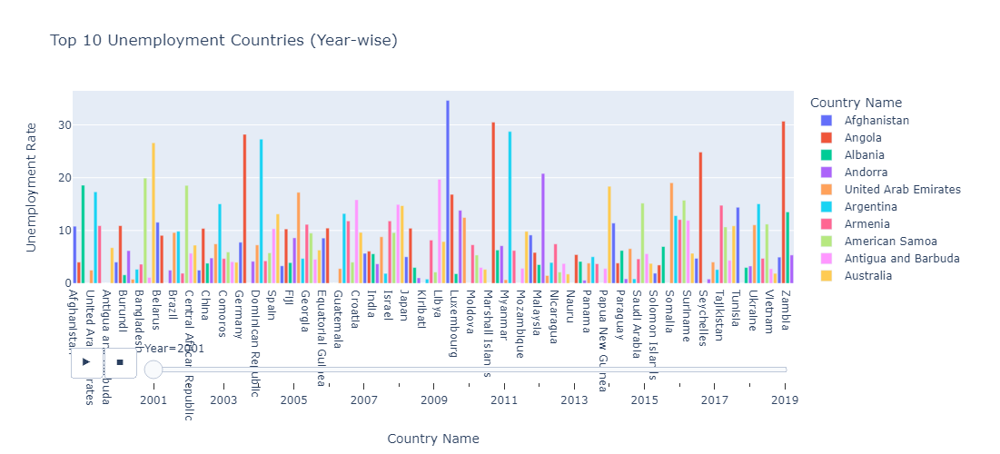

In [12]:
# Create an animated bar chart race
fig = px.bar(data, x='Country Name', y='Unemployment', color='Country Name',
             animation_frame='Year', animation_group='Country Name',
             title='Top 10 Unemployment Countries (Year-wise)',
             labels={'Unemployment': 'Unemployment Rate'},
             height=500)

# Show the animated bar chart
fig.show()

## INSIGHTS ##

# Impact of Prevelance of Undernourishment on Life Expectancy #

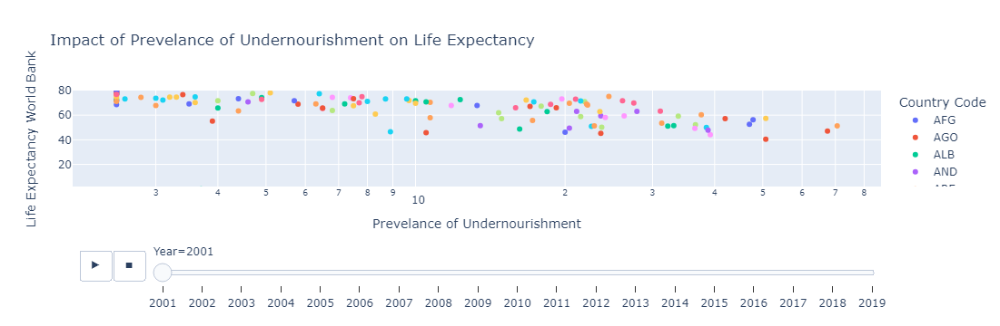

In [13]:
# Create scatter plot
fig = px.scatter(data, x='Prevelance of Undernourishment', y="Life Expectancy World Bank", animation_frame="Year", animation_group="Country Code",
                 color="Country Code", hover_name="Country Name", title="Impact of Prevelance of Undernourishment on Life Expectancy",
                 log_x=True,range_y=[2,80])
fig.show()

## INSIGHTS ##

## Health Expenditures over countries ##

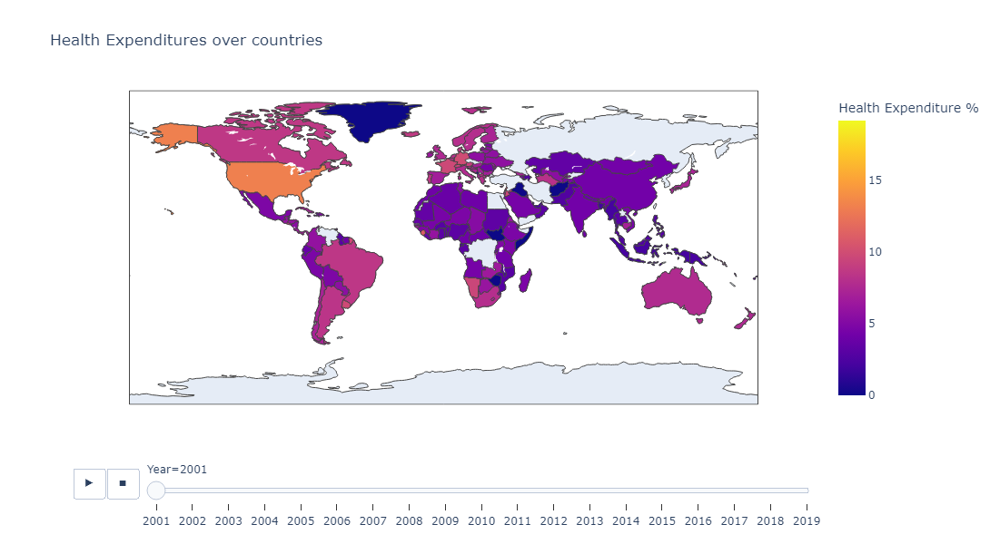

In [14]:
fig = px.choropleth(data, locations='Country Code', 
                    color="Health Expenditure %", hover_name="Country Name", 
                    animation_frame="Year",title="Health Expenditures over countries")
fig.update_layout(height=600, width=800)
fig.show()

## INSIGHTS ##

# MANAGERIAL IMPLICATIONS #